<a href="https://colab.research.google.com/github/kushvatsa/AML/blob/main/IVA_TASK4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [28]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow

In [25]:
main_loc='/content/drive/MyDrive/IVA/videos/'

In [26]:
def calc(original, name, feature_params, lk_params ):
    
    cap = cv.VideoCapture(main_loc + original)
    ret, old_frame = cap.read()
    old_gray = cv.cvtColor(old_frame, cv.COLOR_BGR2GRAY)
    p0 = cv.goodFeaturesToTrack(old_gray, mask = None, **feature_params)

    mask = np.zeros_like(old_frame)
    img_array=[]

    for i in range(int(cap.get(cv.CAP_PROP_FRAME_COUNT))-1):
        ret,frame = cap.read()
        frame_gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)

        p1, st, err = cv.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)

        if p1 is None:
            p0 = cv.goodFeaturesToTrack(old_gray, mask = None, **feature_params)
            p1, st, err = cv.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)

        good_new = p1[st==1]
        good_old = p0[st==1]

        for i,(new,old) in enumerate(zip(good_new, good_old)):
            a,b = new.ravel()
            c,d = old.ravel()
            mask = cv.line(mask, (a,b),(c,d), [0, 255, 0], 2)
            frame = cv.circle(frame,(a,b),5,[0, 255, 0],-1)
        
        img = cv.add(frame,mask)
        img_array.append(img)
        h,w = img.shape[:2]

        k = cv.waitKey(30) & 0xff
        if k == 27:
            break

        old_gray = frame_gray.copy()
        p0 = good_new.reshape(-1,1,2)

    out = cv.VideoWriter(main_loc + 'points/'+name+'.avi',cv.VideoWriter_fourcc(*'XVID'), 30, (w,h))
    
    for i in range(len(img_array)):
        out.write(img_array[i])

    return out

In [19]:
name = 'fishes_result'
original_name = 'fishes.mpg'

feature_params = dict( maxCorners = 200,
                       qualityLevel = 0.06,
                       minDistance = 30,
                       blockSize = 15 )

lk_params = dict( winSize  = (5,5),
                  maxLevel = 2,
                  criteria = (cv.TERM_CRITERIA_EPS | cv.TERM_CRITERIA_COUNT, 10, 0.03))

out = calc(original_name, name, feature_params, lk_params )
out.release()

In [22]:
name = 'motor_result'
original_name = 'motor.mpg'

feature_params = dict( maxCorners = 50,
                       qualityLevel = 0.1,
                       minDistance = 10,
                       blockSize = 10 )

lk_params = dict( winSize  = (300,300),
                  maxLevel = 3,
                  criteria = (cv.TERM_CRITERIA_EPS | cv.TERM_CRITERIA_COUNT, 10, 0.03))

out = calc(original_name, name, feature_params, lk_params )
out.release()

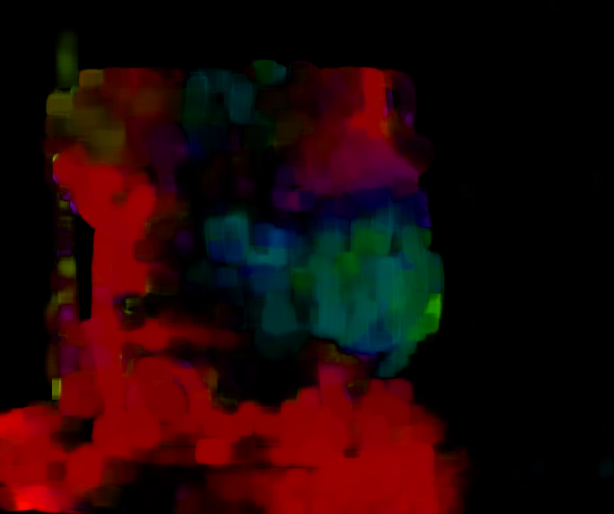

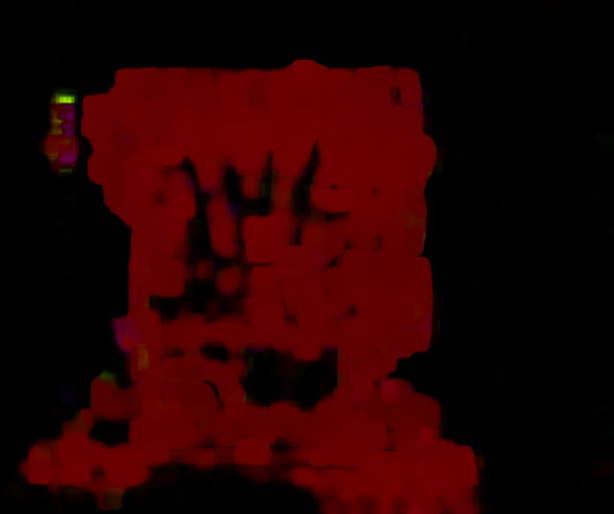

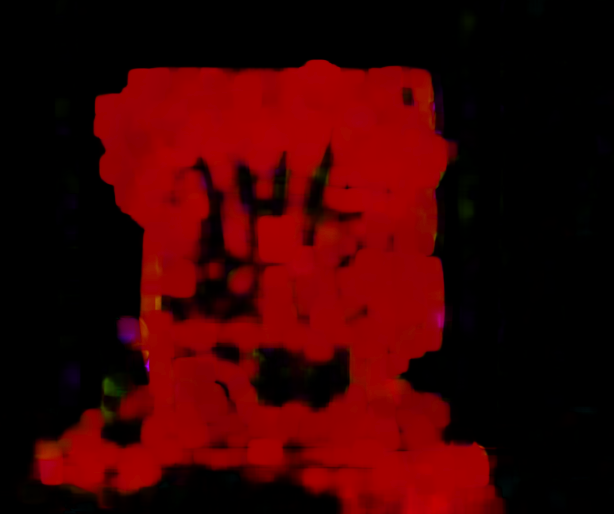

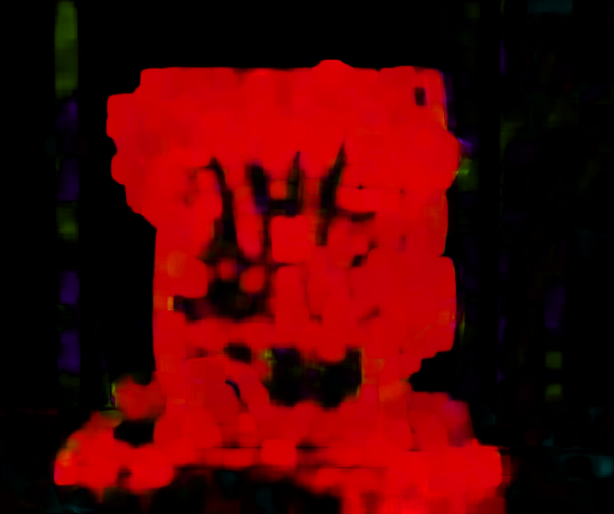

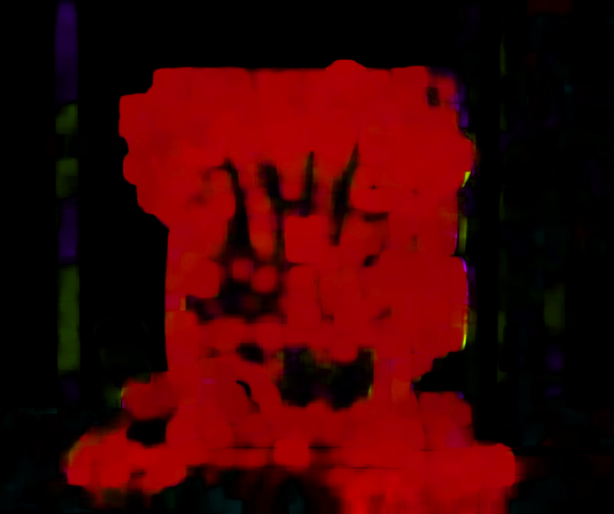

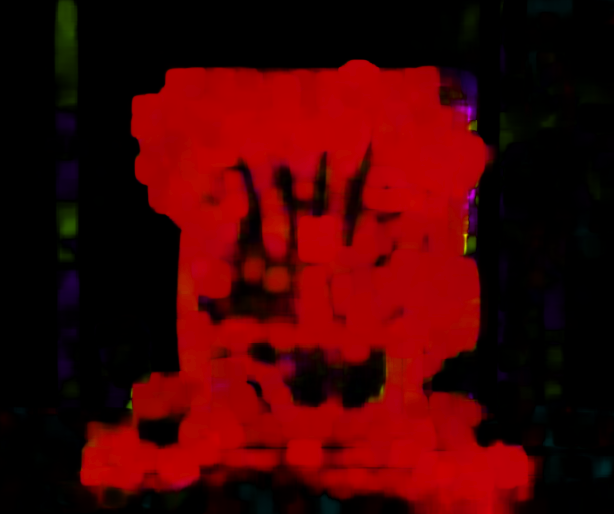

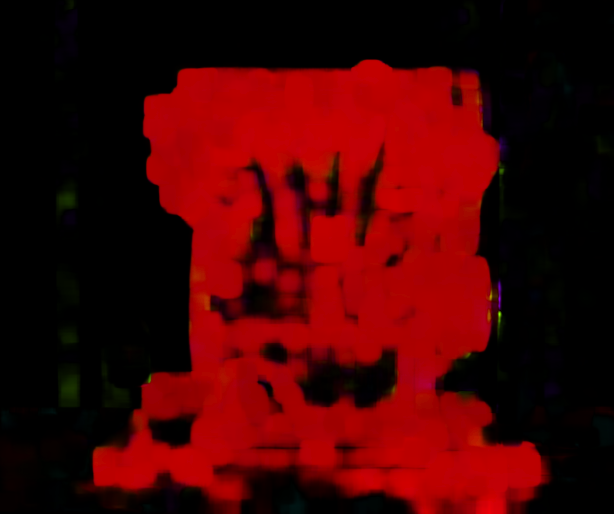

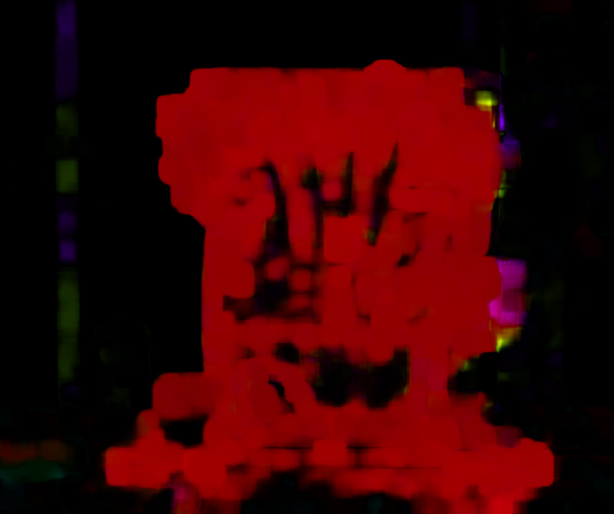

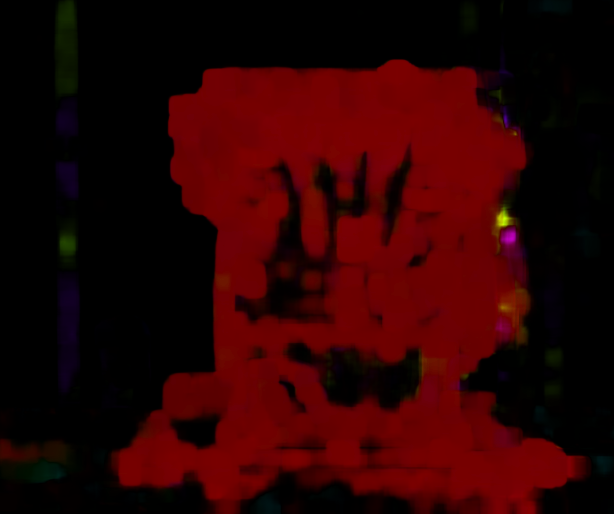

In [23]:
name = 'motor.mpg'
cap = cv.VideoCapture(main_loc + name)
ret, frame1 = cap.read()
prvs = cv.cvtColor(frame1,cv.COLOR_BGR2GRAY)
hsv = np.zeros_like(frame1)
hsv[...,1] = 255
img_array=[]

for i in range(int(cap.get(cv.CAP_PROP_FRAME_COUNT))-1):
    ret, frame2 = cap.read()
    next = cv.cvtColor(frame2,cv.COLOR_BGR2GRAY)
    flow = cv.calcOpticalFlowFarneback(prvs,next, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    mag, ang = cv.cartToPolar(flow[...,0], flow[...,1])
    hsv[...,0] = ang*180/np.pi/2
    hsv[...,2] = cv.normalize(mag,None,0,255,cv.NORM_MINMAX)
    bgr = cv.cvtColor(hsv,cv.COLOR_HSV2BGR)
    h,w = bgr.shape[:2]
    cv_imshow(bgr)
    img_array.append(bgr)

    k = cv.waitKey(30) & 0xff
    if k == 27:
        break
    prvs = next


out = cv.VideoWriter(main_loc + '/optical_flow/'+name+'.avi',cv.VideoWriter_fourcc(*'XVID'), 1, (w,h))
 
for i in range(len(img_array)):
    out.write(img_array[i])

out.release()

In [36]:
# Parameters for lucas kanade optical flow
lk_params = dict( winSize  = (15,15),
                  maxLevel = 3,
                  criteria = (cv.TERM_CRITERIA_EPS | cv.TERM_CRITERIA_COUNT, 10, 0.03))

# params for ShiTomasi corner detection
feature_params = dict( maxCorners = 0,
                       qualityLevel = 0.3,
                       minDistance = 7,
                       blockSize = 7)

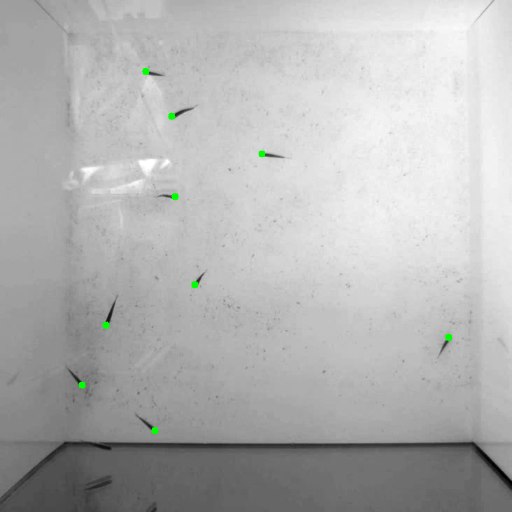

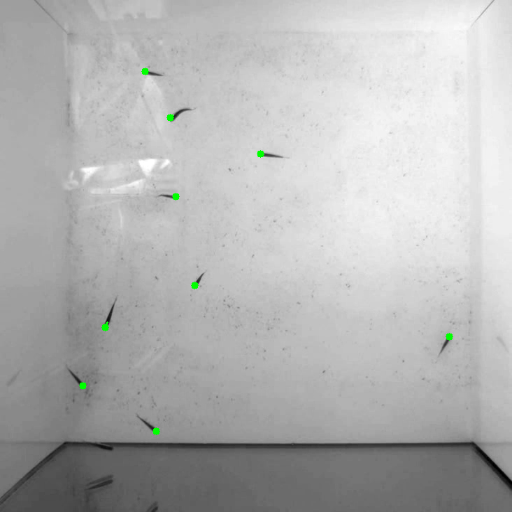

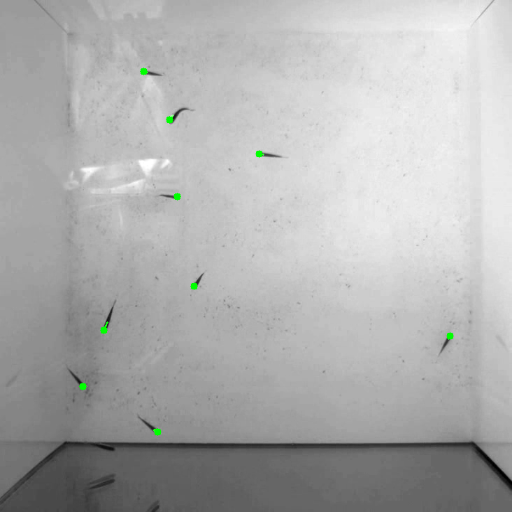

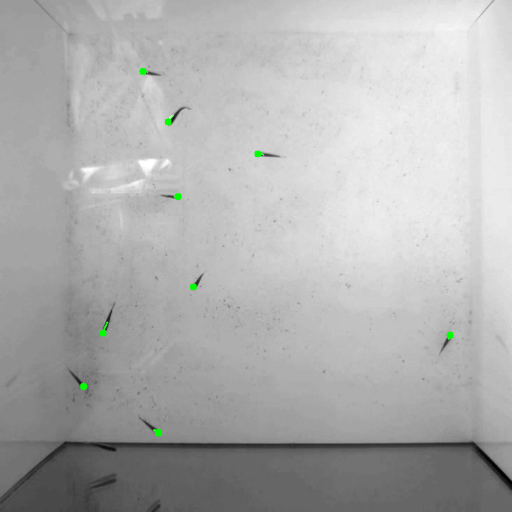

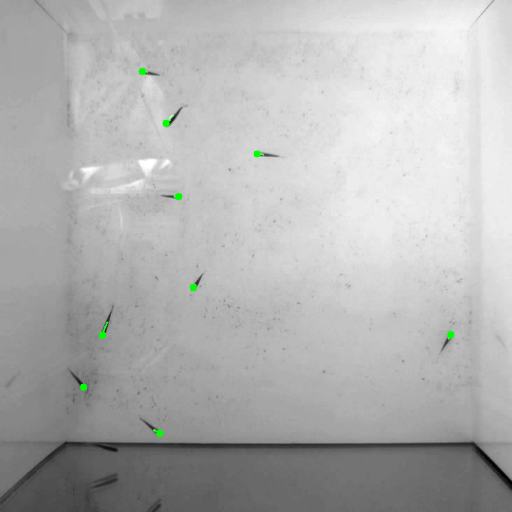

...

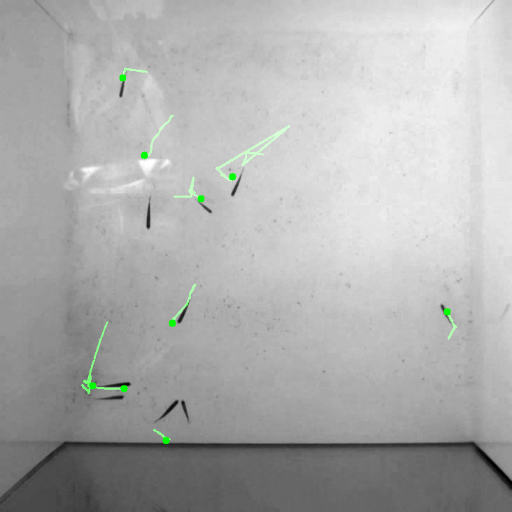

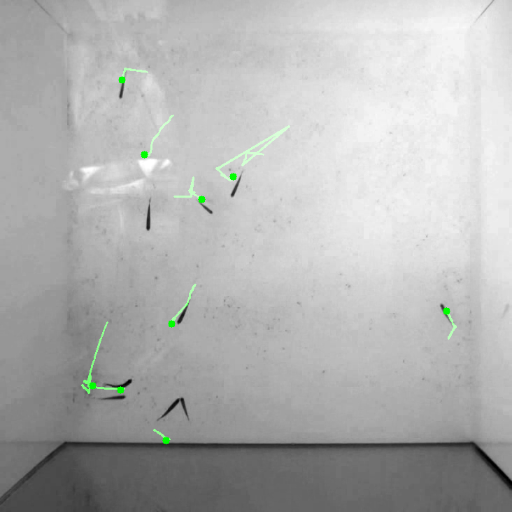

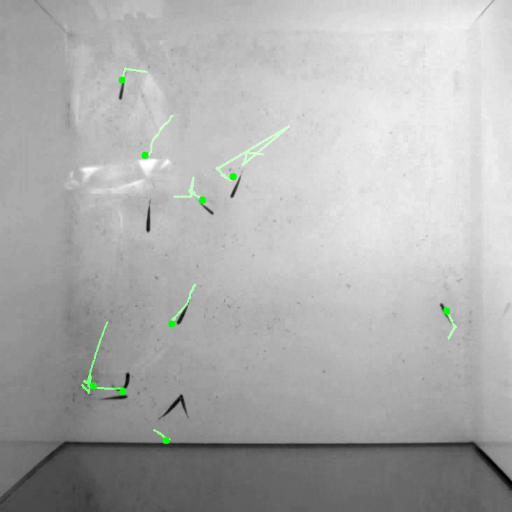

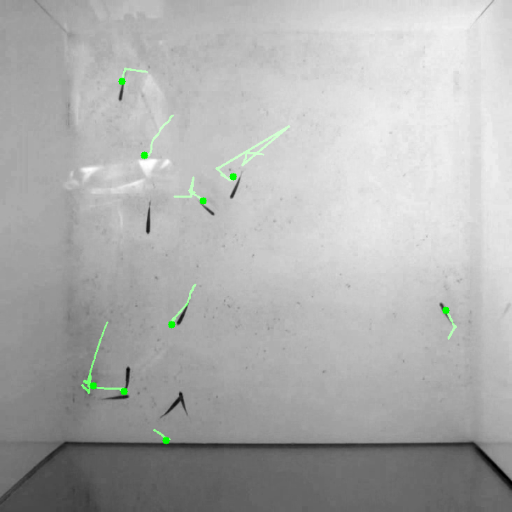

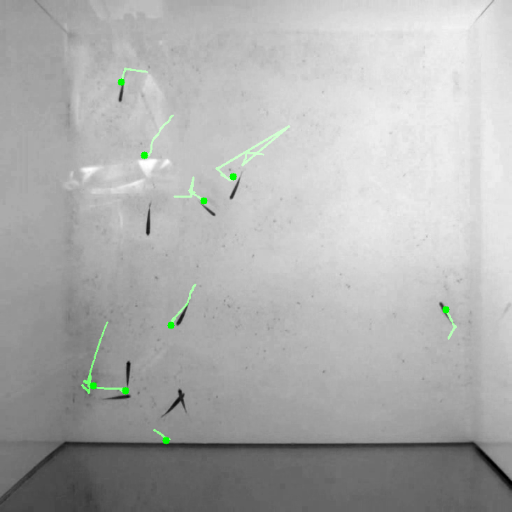

In [38]:
filename = '/content/drive/MyDrive/IVA/videos/fishes.mpg'
fileout = '/content/drive/MyDrive/IVA/videos/fishes_out.avi'

cap = cv.VideoCapture(filename)

frame_width = int(cap.get(3))
frame_height = int(cap.get(4))


# Take first frame and find corners in it
ret, old_frame = cap.read()
old_gray = cv.cvtColor(old_frame, cv.COLOR_BGR2GRAY)
p0 = cv.goodFeaturesToTrack(old_gray, mask = None, **feature_params)

# Create a mask image for drawing purposes
mask = np.zeros_like(old_frame)
recap = cv.VideoWriter(fileout, cv.VideoWriter_fourcc('M', 'J', 'P', 'G'), 20, (frame_width, frame_height))

while(1):
    ret,frame = cap.read()
    if ret:
        frame_gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)

        # calculate optical flow
        p1, st, err = cv.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)
        
        try:
            # Select good points
            good_new = p1[st==1]
            good_old = p0[st==1]

            # draw the tracks
            for i,(new,old) in enumerate(zip(good_new,good_old)):
                a,b = new.ravel()
                c,d = old.ravel()
                mask = cv.line(mask, (a,b),(c,d), (0,255,0), 2)
                frame = cv.circle(frame,(a,b),5,(0,255,0),-1)
            img = cv.add(frame,mask)

            img_resized = cv.resize(img,(512,512), cv.INTER_CUBIC)

            recap.write(img)
            cv2_imshow(img_resized)
            # Now update the previous frame and previous points
            old_gray = frame_gray.copy()
            p0 = good_new.reshape(-1,1,2)
        except:
            break
    else:
        break
    k = cv.waitKey(30) & 0xff
    if k == 27:
        break


cv.destroyAllWindows()
cap.release()
recap.release()

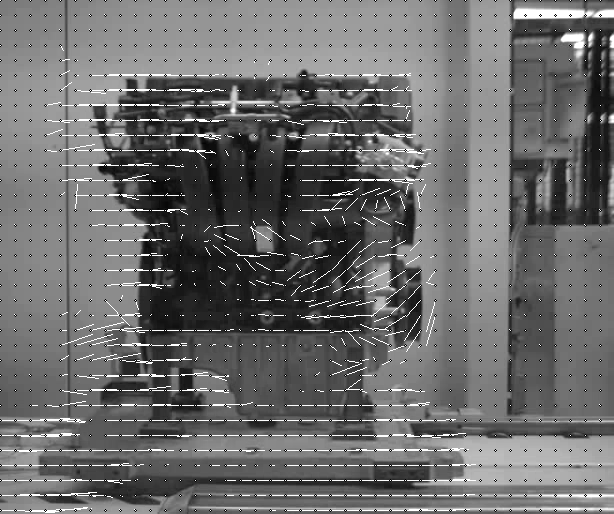

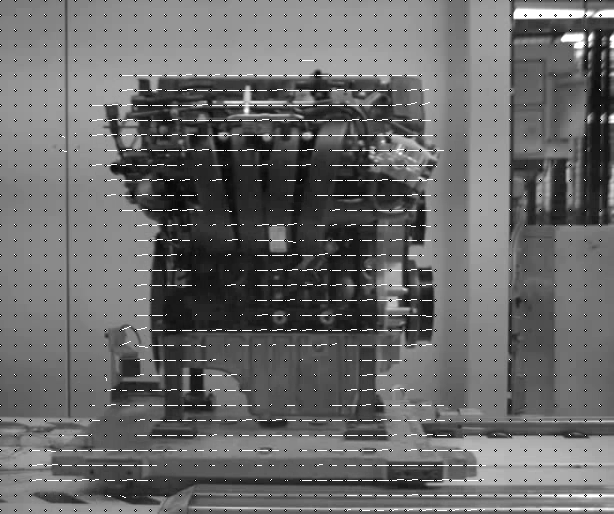

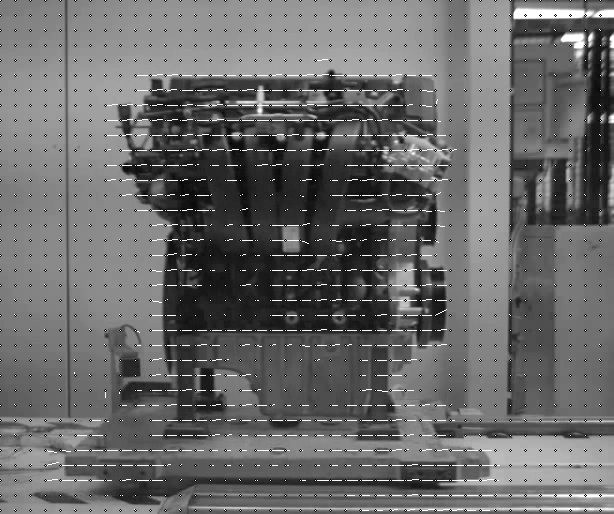

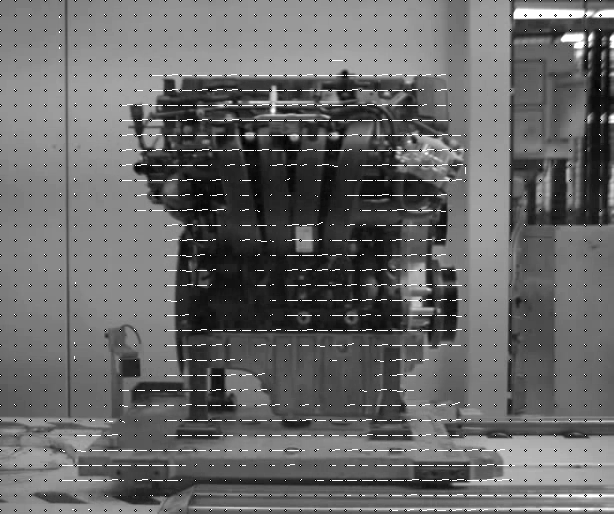

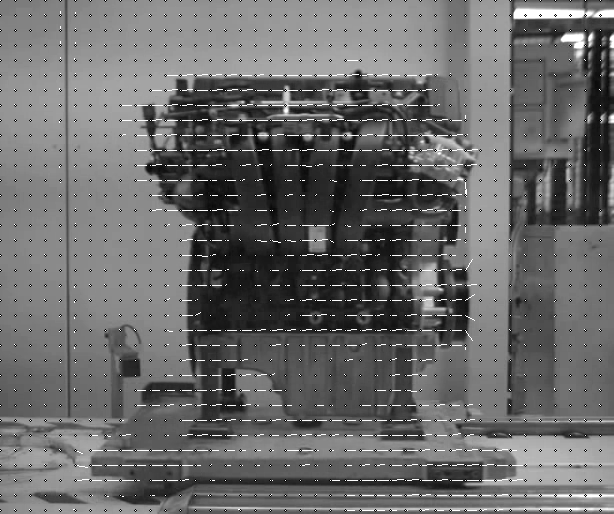

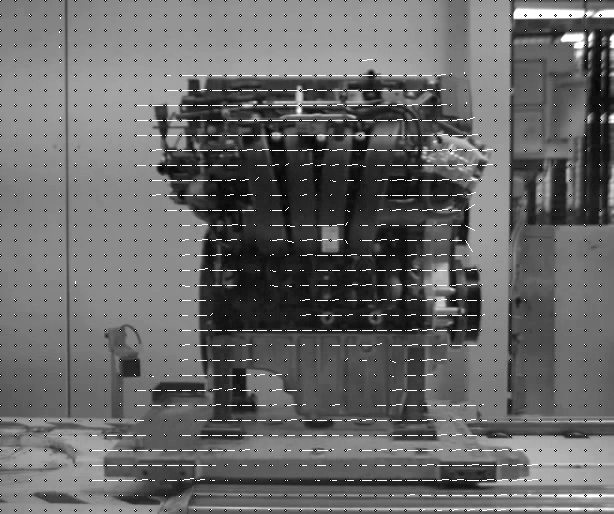

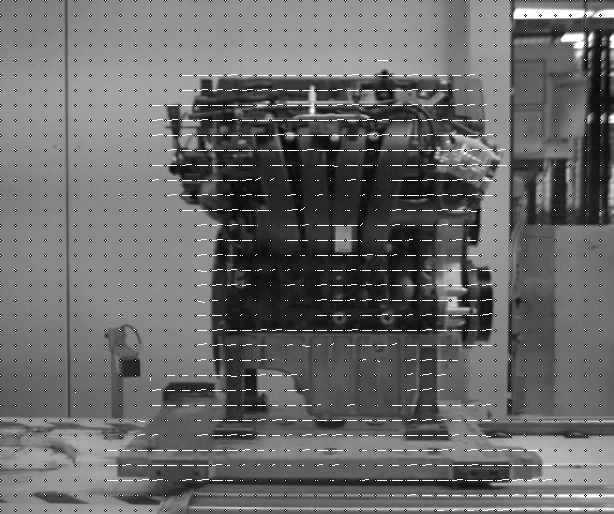

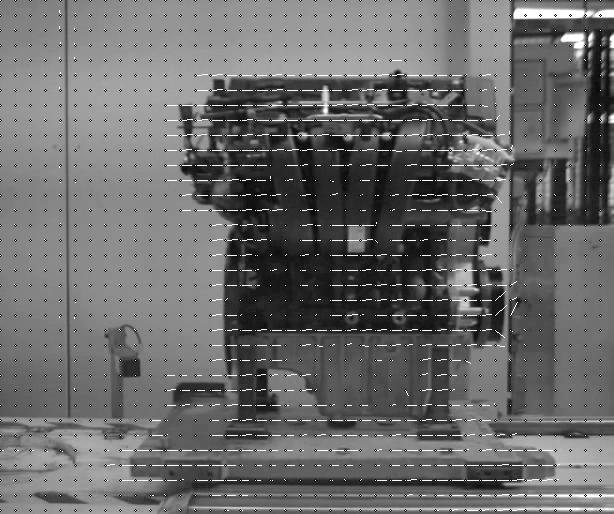

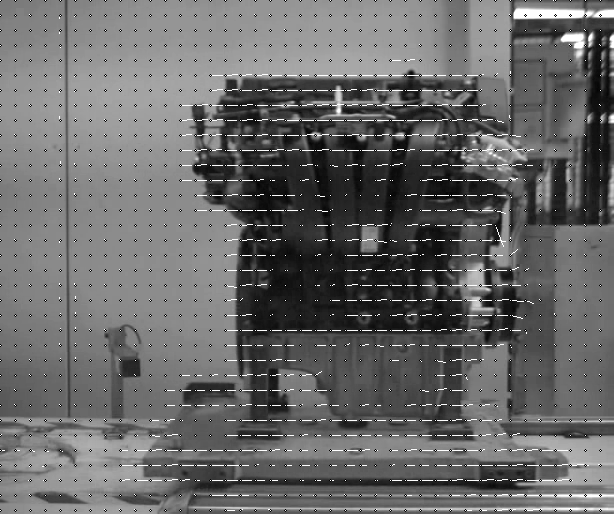

In [31]:
filename = '/content/drive/MyDrive/IVA/videos/motor.mpg'
cap = cv.VideoCapture(filename)
ret, frame1 = cap.read()
prvs = cv.cvtColor(frame1,cv.COLOR_BGR2GRAY)

frame_width = int(cap.get(3))
frame_height = int(cap.get(4))

fileout = '/content/drive/MyDrive/IVA/videos/motor_result.avi'
recap = cv.VideoWriter(fileout, cv.VideoWriter_fourcc('M', 'J', 'P', 'G'), 2, (frame_width, frame_height))

while(1):
    ret, frame2 = cap.read()
    if ret:
        nxt = cv.cvtColor(frame2, cv.COLOR_BGR2GRAY)
        flow = cv.calcOpticalFlowFarneback(prvs, nxt, None, 0.5, 3, 15, 3, 7, 1.5, 0)
        vfield = frame2.copy()
        for x in range(0, frame2.shape[0], 15):
            for y in range(0, frame2.shape[1], 15):
                xflow, yflow = flow[x, y]
                cv.line(vfield, (y, x), (int(y + xflow), int(x + yflow)), (255, 255, 255), 1)
                cv.circle(vfield, (y, x), 1, (0, 0, 0), 1)
        cv2_imshow(vfield)
        recap.write(vfield)
    else:
        break

    k = cv.waitKey(30) & 0xff
    if k == 27:
        break
    prvs = nxt

cap.release()
recap.release()

cv.destroyAllWindows()